In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()


import importlib
from libs import trades, plots, params, feats, strategies
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import os
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

In [3]:
# Read the unscaled indicators dataframe (only the test part)

df_inds_test = pd.read_csv(params.indunsc_test_csv, index_col=0, parse_dates=True)
# compute synthetic ask/bid from close_raw and configured spread
df_inds_test['ask'] = df_inds_test['close'] * (1 + params.bidask_spread_pct/100)
df_inds_test['bid'] = df_inds_test['close'] * (1 - params.bidask_spread_pct/100)
df_inds_test['rsi_thresh'] = params.rsi_thresh_tick

df_inds_test

,open,high,low,close,volume,signal,ret,log_ret,sma_9,sma_21,sma_pct_9,sma_pct_21,ema_9,ema_21,roc_9,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,macd_line,macd_signal,macd_diff,atr_14,atr_pct_14,bb_lband_20,bb_hband_20,bb_w_20,plus_di,minus_di,adx,obv,vwap_14,vwap_dev_pct_14,vol_spike,vol_z_14,rolling_max_close_21,rolling_min_close_21,dist_high_21,dist_low_21,obv_sma,obv_diff_14,obv_pct_14,obv_sma_14,obv_z_14,ret_30,sma_30,sma_pct_30,ema_30,roc_30,rsi_30,atr_30,atr_pct_30,bb_lband_30,bb_hband_30,bb_w_30,plus_di_30,minus_di_30,adx_30,obv_diff_30,obv_pct_30,obv_sma_30,obv_z_30,vwap_30,vwap_dev_pct_30,z_vwap_dev_30,vol_spike_30,vol_z_30,ret_std_30,rolling_max_close_30,rolling_min_close_30,dist_high_30,dist_low_30,macd_line_30,macd_signal_30,macd_diff_30,ret_45,sma_45,sma_pct_45,ema_45,roc_45,rsi_45,atr_45,atr_pct_45,bb_lband_45,bb_hband_45,bb_w_45,plus_di_45,minus_di_45,adx_45,obv_diff_45,obv_pct_45,obv_sma_45,obv_z_45,vwap_45,vwap_dev_pct_45,z_vwap_dev_45,vol_spike_45,vol_z_45,ret_std_45,rolling_max_close_45,rolling_min_close_45,dist_high_45,dist_low_45,macd_line_45,macd_signal_45,macd_diff_45,ret_60,sma_60,sma_pct_60,ema_60,roc_60,rsi_60,atr_60,atr_pct_60,bb_lband_60,bb_hband_60,bb_w_60,plus_di_60,minus_di_60,adx_60,obv_diff_60,obv_pct_60,obv_sma_60,obv_z_60,vwap_60,vwap_dev_pct_60,z_vwap_dev_60,vol_spike_60,vol_z_60,ret_std_60,rolling_max_close_60,rolling_min_close_60,dist_high_60,dist_low_60,macd_line_60,macd_signal_60,macd_diff_60,volume_z_30,vol_spike_z_30,ret_std_z_30,obv_pct_z_30,vwap_dev_pct_z_30,bb_w_z_30,atr_z_30,macd_diff_z_30,volume_z_45,vol_spike_z_45,ret_std_z_45,obv_pct_z_45,vwap_dev_pct_z_45,bb_w_z_45,atr_z_45,macd_diff_z_45,volume_z_60,vol_spike_z_60,ret_std_z_60,obv_pct_z_60,vwap_dev_pct_z_60,bb_w_z_60,atr_z_60,macd_diff_z_60,minute_time,hour_time,dow_time,month_time,day_of_year_time,week_of_year_time,in_sess_time,eng_ma,eng_macd,eng_bb,eng_bb_mid,eng_rsi,eng_adx,eng_obv,eng_atr_div,z_eng_atr,eng_sma_short,eng_sma_long,eng_vwap,z_vwap_dev,z_bb_w,z_obv,mom_sum_30,mom_std_30,mom_sum_45,mom_std_45,mom_sum_60,mom_std_60,eng_ema_cross_up,eng_ema_cross_down,ask,bid,rsi_thresh
2022-12-23 10:58:00,132.506667,132.506667,132.506667,132.506667,3.766667e+02,0.068838,-0.000025,-0.000025,132.517407,132.463651,-0.000081,0.000325,132.501714,132.450580,0.000126,0.000428,0.000,0.000000,0.000,0.000,0.000000,55.324571,0.066914,0.076274,-0.009361,0.030896,0.000233,132.351547,132.577120,0.001703,53.329334,22.545811,52.004170,4.810433e+04,132.024282,0.365375,0.462019,-0.911671,132.540,132.36,0.000252,0.001107,4.767483e+04,4.656333e+03,35.146275,4.767483e+04,0.269138,0.002547,132.419889,0.000655,132.403860,0.002547,67.514546,0.034648,0.000261,132.220285,132.619493,0.003015,49.033670,19.075239,40.643327,1.196033e+04,90.321276,4.478294e+04,0.370286,132.417943,0.067003,-1.435313,0.424020,-0.936193,0.000271,132.540,132.20,0.000252,0.002314,0.084061,0.080324,0.003737,0.003663,132.310329,0.001484,132.330747,0.003663,67.477198,0.037214,0.000281,131.957731,132.662926,0.005330,45.383192,19.249055,28.521447,2.131996e+04,161.136009,4.104582e+04,0.244755,132.288077,0.165238,-0.378640,0.394909,-1.100015,0.000230,132.540,132.028750,0.000252,0.003607,0.072126,0.069040,0.003086,0.004638,132.228319,0.002105,132.270541,0.004638,66.814987,0.038612,0.000291,131.810366,132.646273,0.006322,43.207120,20.127475,0.000000,4.737383e+04,358.272975,3.439157e+04,0.345499,132.165188,0.258373,0.724499,0.327654,-1.358106,0.000201,132.540,131.922500,0.000252,0.004409,0.063599,0.059554,0.004045,-0.467325,-0.000002,0.190732,-0.326255,-0.796174,-0.714829,-2.471902,-20.000000,-0.677505,-0.000002,20.000000,-20.000000,-20.000000,20.000000,-1.096288,0.000000,-0.861826,-1.606155e-11,0.000000,0.000000,20.000000,20.000000,-0.187204,0.000000,0.352778,0.312500,0.071429,0.416667,0.475342,0.461538,0.0,0.000406,-0.000071,0.00000,-0.000319,0.000000,0.098520,0.099620,-0.242750,-1.828533,0.000081,-0.000325,-99.724259,-0.805629,0.201443,-0.950054,0.087051,0.000484,0.145175

In [4]:
importlib.reload(params) #####
importlib.reload(strategies) #####
strategies.reset_globals() # reset global variables before calling the strategies functions

# df_inds_test = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check] ################################

sim_results = {}
groups = df_inds_test.groupby(df_inds_test.index.normalize())
total_days = df_inds_test.index.normalize().nunique()
col_signal = params.col_signal_tick
sign_thresh = params.sign_thresh_tick

for day, df_day_sim in tqdm(groups, desc="Generate+Simulate", total=total_days):
    
    df_actions = strategies.generate_actions(
        df              = df_day_sim,
        col_signal      = col_signal,
        sign_thresh     = sign_thresh,
        col_atr         = "atr_14",
        col_rsi         = "rsi_6",
        col_vwap        = "vwap_14",
        reset_peak      = params.reset_peak_tick,
        rsi_thresh      = params.rsi_thresh_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        sess_start      = params.sess_start_tick
    )
    
    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            invest_frac = params.invest_frac_tick,
            buy_factor  = params.buy_factor_tick,
            sell_factor = params.sell_factor_tick,
            sess_start  = params.sess_start_tick
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Generate+Simulate:   0%|          | 0/622 [00:00<?, ?it/s]

Loop finished. Days simulated: 622


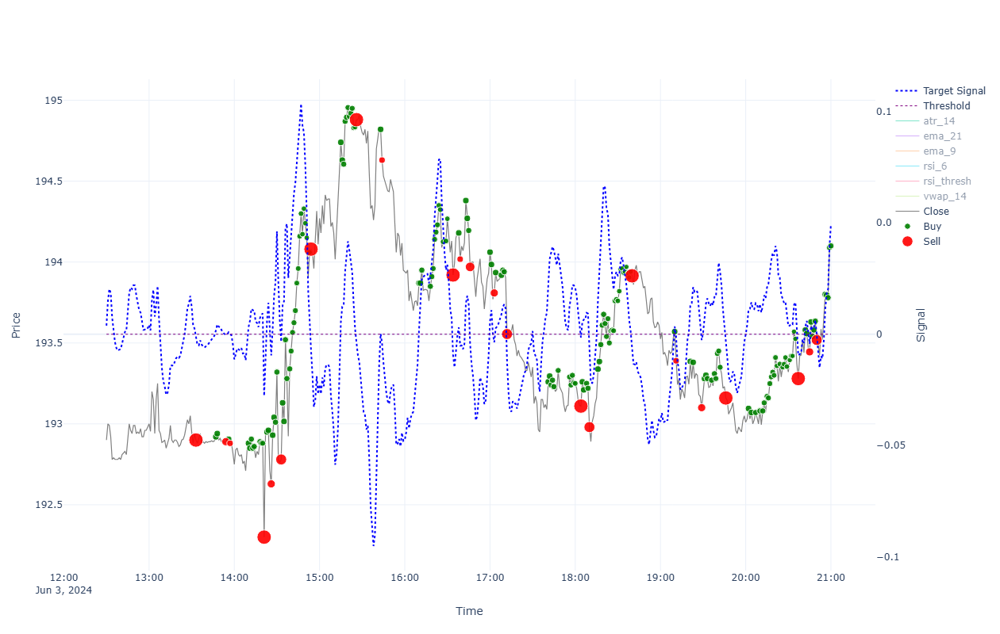


=== Performance for 2024-06-03 ===

INTRADAY:
  shares(533); [ask_buy=192.989, fee_buy=0.004, pos_amnt_buy=102865.05]; [bid_sell=194.061, fee_sell=0.018, pos_amnt_sell=103424.773]; PNL=559.723
TRADES:
  Tr[1]: Time(13:33)Ask(192.939)Bid(192.861)Act(Sell)Shrs(88)Pos(0); CashTr(16970.184)=Cost(16971.805)-Fee(-1.621); P&L(23438.482)=CashTot(23438.482)+PosAmt(0.0)
  Tr[2]: Time(13:47)Ask(192.959)Bid(192.881)Act(Buy)Shrs(7)Pos(7); CashTr(-1350.738)=Cost(-1350.71)-Fee(-0.028); P&L(23437.914)=CashTot(22087.744)+PosAmt(1350.17)
  Tr[3]: Time(13:48)Ask(192.979)Bid(192.901)Act(Buy)Shrs(7)Pos(14); CashTr(-1350.878)=Cost(-1350.85)-Fee(-0.028); P&L(23437.486)=CashTot(20736.866)+PosAmt(2700.62)
  Tr[4]: Time(13:54)Ask(192.929)Bid(192.851)Act(Sell)Shrs(14)Pos(0); CashTr(2699.662)=Cost(2699.92)-Fee(-0.258); P&L(23436.528)=CashTot(23436.528)+PosAmt(0.0)
  Tr[5]: Time(13:56)Ask(192.944)Bid(192.866)Act(Buy)Shrs(7)Pos(7); CashTr(-1350.633)=Cost(-1350.605)-Fee(-0.028); P&L(23435.96)=CashTot(22085.895)+Pos

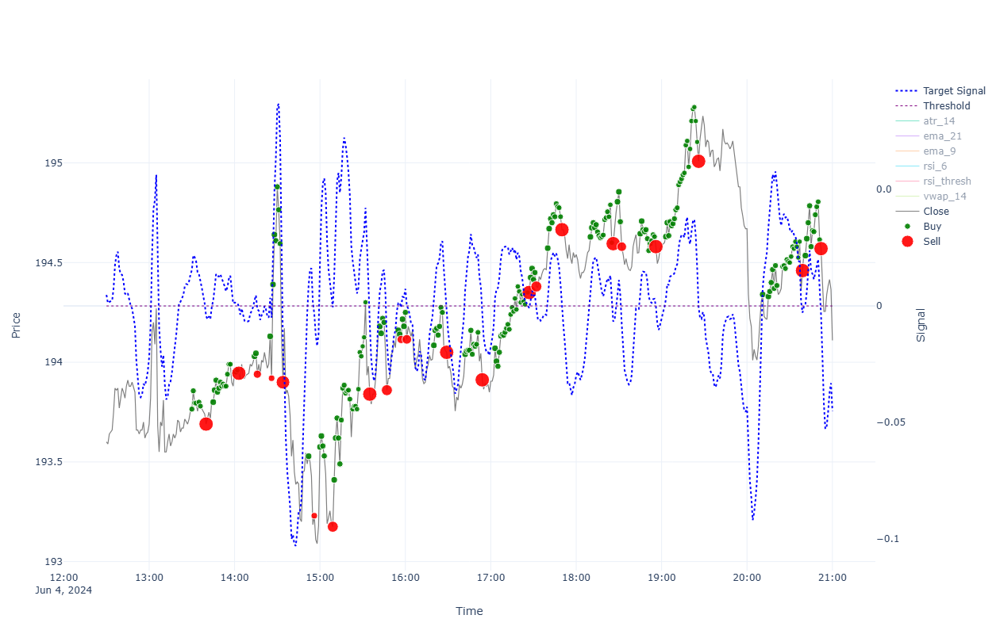


=== Performance for 2024-06-04 ===

INTRADAY:
  shares(533); [ask_buy=193.804, fee_buy=0.004, pos_amnt_buy=103299.532]; [bid_sell=194.071, fee_sell=0.018, pos_amnt_sell=103430.102]; PNL=130.57
TRADES:
  Tr[1]: Time(13:30)Ask(193.804)Bid(193.726)Act(Buy)Shrs(5)Pos(37); CashTr(-969.039)=Cost(-969.019)-Fee(-0.02); P&L(23316.768)=CashTot(16148.897)+PosAmt(7167.871)
  Tr[2]: Time(13:31)Ask(193.895)Bid(193.818)Act(Buy)Shrs(5)Pos(42); CashTr(-969.497)=Cost(-969.477)-Fee(-0.02); P&L(23319.753)=CashTot(15179.4)+PosAmt(8140.353)
  Tr[3]: Time(13:32)Ask(193.835)Bid(193.757)Act(Buy)Shrs(5)Pos(47); CashTr(-969.194)=Cost(-969.174)-Fee(-0.02); P&L(23316.796)=CashTot(14210.206)+PosAmt(9106.59)
  Tr[4]: Time(13:33)Ask(193.834)Bid(193.756)Act(Buy)Shrs(5)Pos(52); CashTr(-969.189)=Cost(-969.169)-Fee(-0.02); P&L(23316.342)=CashTot(13241.017)+PosAmt(10075.325)
  Tr[5]: Time(13:35)Ask(193.839)Bid(193.761)Act(Buy)Shrs(4)Pos(56); CashTr(-775.371)=Cost(-775.355)-Fee(-0.016); P&L(23316.275)=CashTot(12465.646)+P

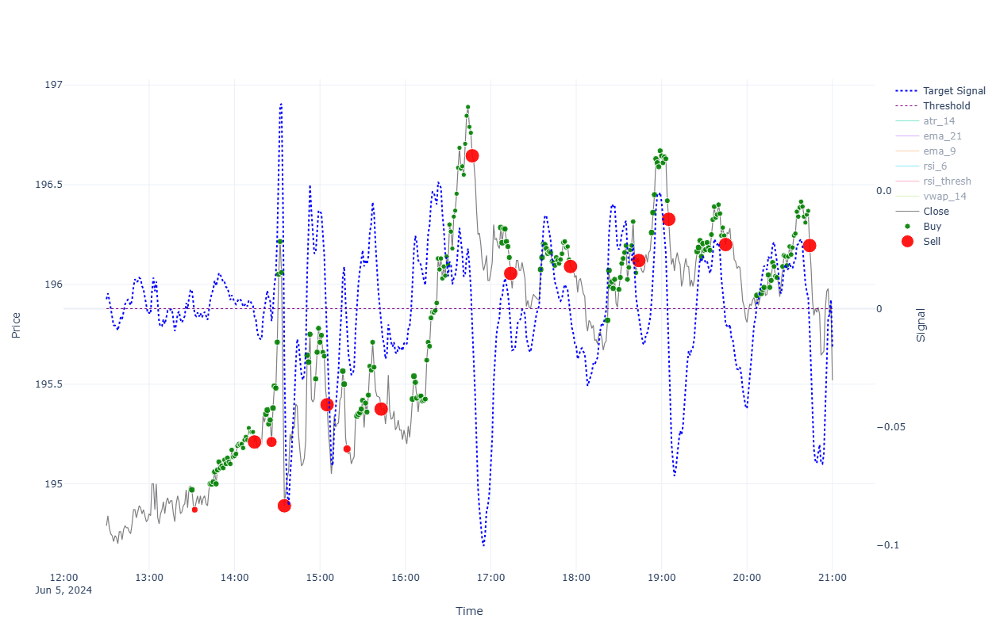


=== Performance for 2024-06-05 ===

INTRADAY:
  shares(530); [ask_buy=195.009, fee_buy=0.004, pos_amnt_buy=103356.887]; [bid_sell=195.481, fee_sell=0.018, pos_amnt_sell=103595.078]; PNL=238.191
TRADES:
  Tr[1]: Time(13:30)Ask(195.009)Bid(194.931)Act(Buy)Shrs(7)Pos(7); CashTr(-1365.091)=Cost(-1365.063)-Fee(-0.028); P&L(23158.737)=CashTot(21794.22)+PosAmt(1364.517)
  Tr[2]: Time(13:32)Ask(194.909)Bid(194.831)Act(Sell)Shrs(7)Pos(0); CashTr(1363.688)=Cost(1363.817)-Fee(-0.129); P&L(23157.908)=CashTot(23157.908)+PosAmt(0.0)
  Tr[3]: Time(13:43)Ask(195.039)Bid(194.961)Act(Buy)Shrs(7)Pos(7); CashTr(-1365.301)=Cost(-1365.273)-Fee(-0.028); P&L(23157.334)=CashTot(21792.607)+PosAmt(1364.727)
  Tr[4]: Time(13:44)Ask(195.039)Bid(194.961)Act(Buy)Shrs(7)Pos(14); CashTr(-1365.301)=Cost(-1365.273)-Fee(-0.028); P&L(23156.76)=CashTot(20427.306)+PosAmt(2729.454)
  Tr[5]: Time(13:45)Ask(195.049)Bid(194.971)Act(Buy)Shrs(6)Pos(20); CashTr(-1170.318)=Cost(-1170.294)-Fee(-0.024); P&L(23156.408)=CashTot(19256.

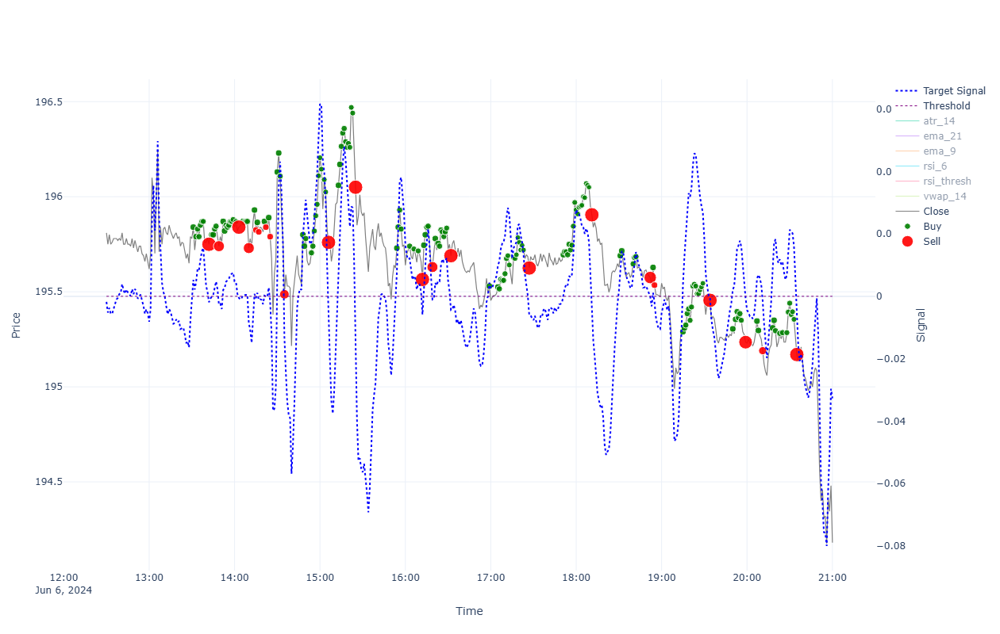


=== Performance for 2024-06-06 ===

INTRADAY:
  shares(529); [ask_buy=195.819, fee_buy=0.004, pos_amnt_buy=103590.45]; [bid_sell=194.141, fee_sell=0.018, pos_amnt_sell=102690.913]; PNL=-899.536
TRADES:
  Tr[1]: Time(13:31)Ask(195.879)Bid(195.801)Act(Buy)Shrs(7)Pos(7); CashTr(-1371.182)=Cost(-1371.154)-Fee(-0.028); P&L(23100.066)=CashTot(21729.46)+PosAmt(1370.606)
  Tr[2]: Time(13:33)Ask(195.829)Bid(195.751)Act(Buy)Shrs(7)Pos(14); CashTr(-1370.832)=Cost(-1370.804)-Fee(-0.028); P&L(23099.14)=CashTot(20358.628)+PosAmt(2740.512)
  Tr[3]: Time(13:34)Ask(195.869)Bid(195.791)Act(Buy)Shrs(6)Pos(20); CashTr(-1175.239)=Cost(-1175.215)-Fee(-0.024); P&L(23099.206)=CashTot(19183.389)+PosAmt(3915.817)
  Tr[4]: Time(13:35)Ask(195.829)Bid(195.751)Act(Buy)Shrs(6)Pos(26); CashTr(-1174.999)=Cost(-1174.975)-Fee(-0.024); P&L(23097.912)=CashTot(18008.39)+PosAmt(5089.522)
  Tr[5]: Time(13:36)Ask(195.889)Bid(195.811)Act(Buy)Shrs(6)Pos(32); CashTr(-1175.359)=Cost(-1175.335)-Fee(-0.024); P&L(23098.978)=CashTot

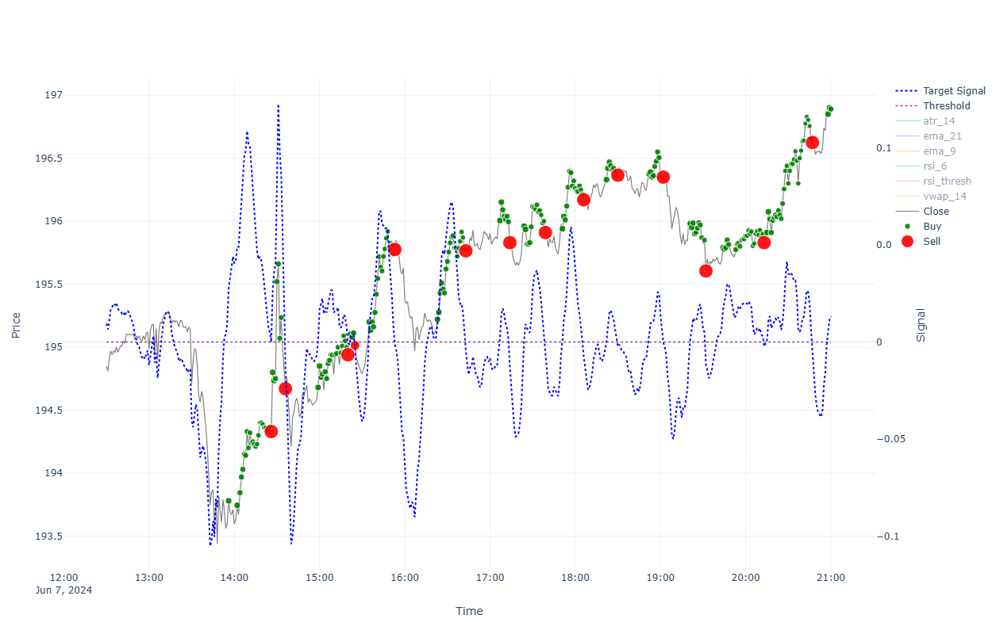


=== Performance for 2024-06-07 ===

INTRADAY:
  shares(527); [ask_buy=194.749, fee_buy=0.004, pos_amnt_buy=102634.8]; [bid_sell=196.851, fee_sell=0.019, pos_amnt_sell=103730.519]; PNL=1095.719
TRADES:
  Tr[1]: Time(13:56)Ask(193.819)Bid(193.741)Act(Buy)Shrs(7)Pos(7); CashTr(-1356.759)=Cost(-1356.731)-Fee(-0.028); P&L(22939.141)=CashTot(21582.952)+PosAmt(1356.189)
  Tr[2]: Time(14:02)Ask(193.784)Bid(193.706)Act(Buy)Shrs(7)Pos(14); CashTr(-1356.514)=Cost(-1356.486)-Fee(-0.028); P&L(22938.325)=CashTot(20226.438)+PosAmt(2711.888)
  Tr[3]: Time(14:04)Ask(193.884)Bid(193.806)Act(Buy)Shrs(6)Pos(20); CashTr(-1163.327)=Cost(-1163.303)-Fee(-0.024); P&L(22939.236)=CashTot(19063.111)+PosAmt(3876.125)
  Tr[4]: Time(14:05)Ask(194.008)Bid(193.93)Act(Buy)Shrs(6)Pos(26); CashTr(-1164.071)=Cost(-1164.047)-Fee(-0.024); P&L(22941.226)=CashTot(17899.041)+PosAmt(5042.185)
  Tr[5]: Time(14:06)Ask(194.069)Bid(193.991)Act(Buy)Shrs(6)Pos(32); CashTr(-1164.437)=Cost(-1164.413)-Fee(-0.024); P&L(22942.322)=CashTo

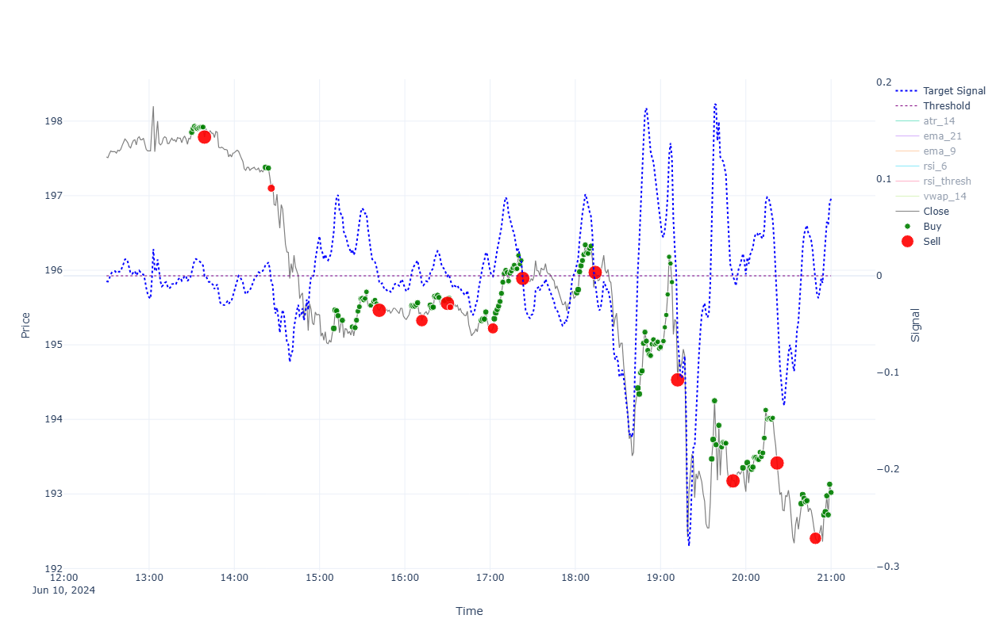


=== Performance for 2024-06-10 ===

INTRADAY:
  shares(524); [ask_buy=197.89, fee_buy=0.004, pos_amnt_buy=103696.231]; [bid_sell=192.981, fee_sell=0.018, pos_amnt_sell=101112.595]; PNL=-2583.636
TRADES:
  Tr[1]: Time(13:30)Ask(197.89)Bid(197.81)Act(Buy)Shrs(6)Pos(26); CashTr(-1187.361)=Cost(-1187.337)-Fee(-0.024); P&L(22905.357)=CashTot(17762.286)+PosAmt(5143.071)
  Tr[2]: Time(13:31)Ask(197.94)Bid(197.86)Act(Buy)Shrs(5)Pos(31); CashTr(-989.718)=Cost(-989.698)-Fee(-0.02); P&L(22906.241)=CashTot(16772.568)+PosAmt(6133.673)
  Tr[3]: Time(13:32)Ask(197.97)Bid(197.89)Act(Buy)Shrs(5)Pos(36); CashTr(-989.868)=Cost(-989.848)-Fee(-0.02); P&L(22906.755)=CashTot(15782.7)+PosAmt(7124.055)
  Tr[4]: Time(13:33)Ask(197.95)Bid(197.87)Act(Buy)Shrs(5)Pos(41); CashTr(-989.768)=Cost(-989.748)-Fee(-0.02); P&L(22905.62)=CashTot(14792.933)+PosAmt(8112.687)
  Tr[5]: Time(13:34)Ask(197.94)Bid(197.86)Act(Buy)Shrs(5)Pos(46); CashTr(-989.718)=Cost(-989.698)-Fee(-0.02); P&L(22904.794)=CashTot(13803.215)+PosAmt(9

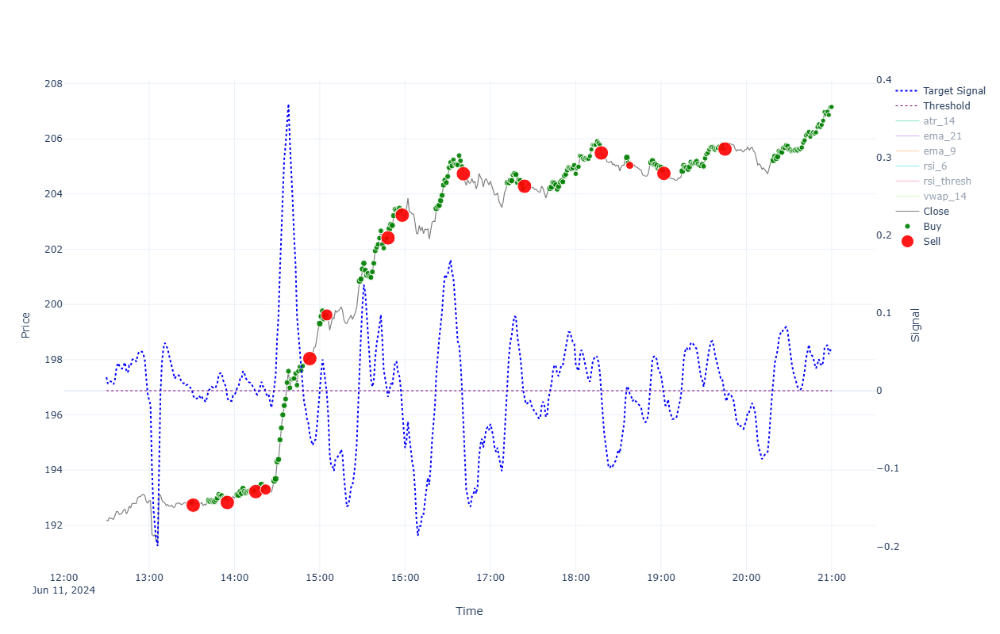


=== Performance for 2024-06-11 ===

INTRADAY:
  shares(524); [ask_buy=192.869, fee_buy=0.004, pos_amnt_buy=101065.225]; [bid_sell=207.109, fee_sell=0.019, pos_amnt_sell=108515.065]; PNL=7449.84
TRADES:
  Tr[1]: Time(13:30)Ask(192.869)Bid(192.791)Act(Buy)Shrs(5)Pos(42); CashTr(-964.363)=Cost(-964.343)-Fee(-0.02); P&L(22718.999)=CashTot(14621.759)+PosAmt(8097.24)
  Tr[2]: Time(13:31)Ask(192.774)Bid(192.696)Act(Sell)Shrs(42)Pos(0); CashTr(8092.477)=Cost(8093.251)-Fee(-0.774); P&L(22714.236)=CashTot(22714.236)+PosAmt(0.0)
  Tr[3]: Time(13:42)Ask(192.939)Bid(192.861)Act(Buy)Shrs(7)Pos(7); CashTr(-1350.598)=Cost(-1350.57)-Fee(-0.028); P&L(22713.668)=CashTot(21363.638)+PosAmt(1350.03)
  Tr[4]: Time(13:43)Ask(192.914)Bid(192.836)Act(Buy)Shrs(7)Pos(14); CashTr(-1350.423)=Cost(-1350.395)-Fee(-0.028); P&L(22712.925)=CashTot(20013.215)+PosAmt(2699.71)
  Tr[5]: Time(13:44)Ask(192.939)Bid(192.861)Act(Buy)Shrs(6)Pos(20); CashTr(-1157.655)=Cost(-1157.631)-Fee(-0.024); P&L(22712.788)=CashTot(18855.559

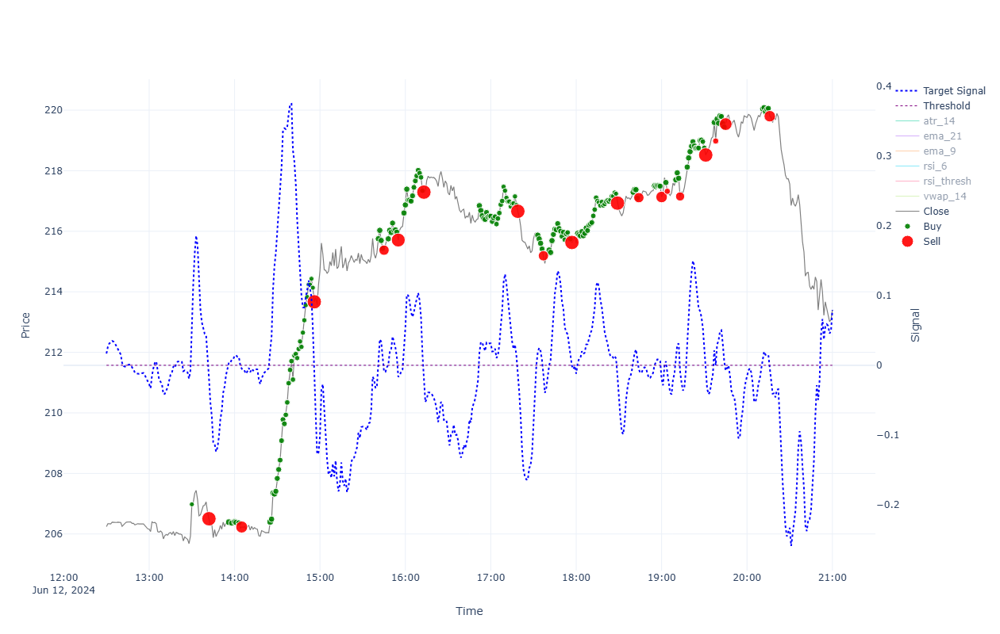


=== Performance for 2024-06-12 ===

INTRADAY:
  shares(524); [ask_buy=207.021, fee_buy=0.004, pos_amnt_buy=108481.308]; [bid_sell=213.357, fee_sell=0.019, pos_amnt_sell=111789.335]; PNL=3308.027
TRADES:
  Tr[1]: Time(13:30)Ask(207.021)Bid(206.939)Act(Buy)Shrs(1)Pos(111); CashTr(-207.025)=Cost(-207.021)-Fee(-0.004); P&L(23134.557)=CashTot(164.372)+PosAmt(22970.185)
  Tr[2]: Time(13:42)Ask(206.545)Bid(206.462)Act(Sell)Shrs(111)Pos(0); CashTr(22915.202)=Cost(22917.282)-Fee(-2.08); P&L(23079.574)=CashTot(23079.574)+PosAmt(0.0)
  Tr[3]: Time(13:56)Ask(206.431)Bid(206.349)Act(Buy)Shrs(7)Pos(7); CashTr(-1445.047)=Cost(-1445.019)-Fee(-0.028); P&L(23078.968)=CashTot(21634.527)+PosAmt(1444.441)
  Tr[4]: Time(13:58)Ask(206.401)Bid(206.319)Act(Buy)Shrs(6)Pos(13); CashTr(-1238.432)=Cost(-1238.408)-Fee(-0.024); P&L(23078.239)=CashTot(20396.095)+PosAmt(2682.143)
  Tr[5]: Time(14:00)Ask(206.441)Bid(206.359)Act(Buy)Shrs(6)Pos(19); CashTr(-1238.672)=Cost(-1238.648)-Fee(-0.024); P&L(23078.239)=CashTot(1

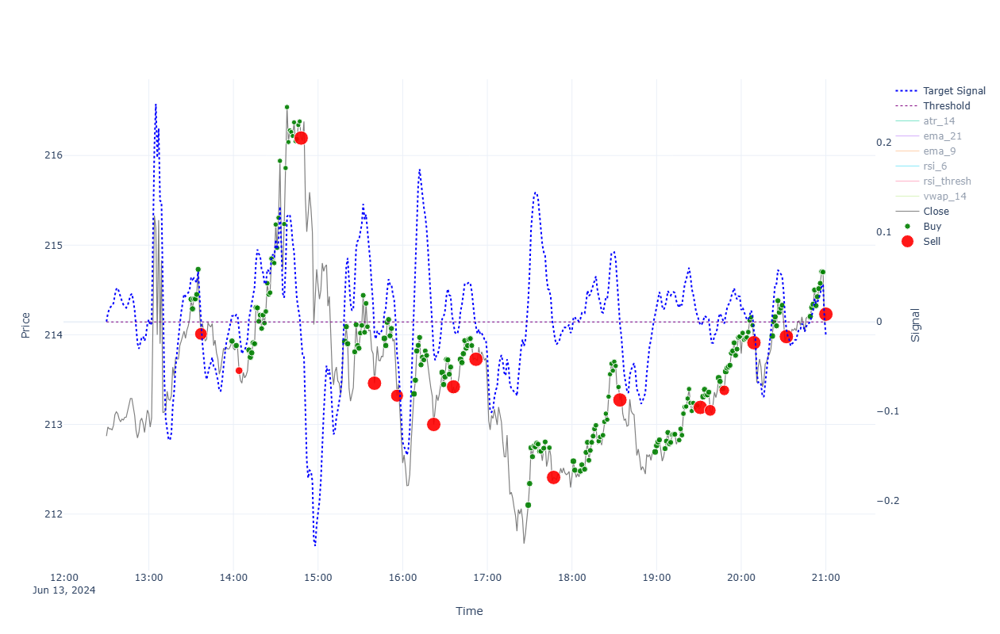


=== Performance for 2024-06-13 ===

INTRADAY:
  shares(521); [ask_buy=214.439, fee_buy=0.004, pos_amnt_buy=111724.844]; [bid_sell=214.187, fee_sell=0.019, pos_amnt_sell=111581.653]; PNL=-143.191
TRADES:
  Tr[1]: Time(13:30)Ask(214.439)Bid(214.353)Act(Buy)Shrs(6)Pos(6); CashTr(-1286.658)=Cost(-1286.634)-Fee(-0.024); P&L(23345.458)=CashTot(22059.338)+PosAmt(1286.12)
  Tr[2]: Time(13:31)Ask(214.333)Bid(214.247)Act(Buy)Shrs(6)Pos(12); CashTr(-1286.021)=Cost(-1285.997)-Fee(-0.024); P&L(23344.283)=CashTot(20773.317)+PosAmt(2570.966)
  Tr[3]: Time(13:32)Ask(214.442)Bid(214.356)Act(Buy)Shrs(6)Pos(18); CashTr(-1286.673)=Cost(-1286.649)-Fee(-0.024); P&L(23345.049)=CashTot(19486.644)+PosAmt(3858.405)
  Tr[4]: Time(13:33)Ask(214.443)Bid(214.357)Act(Buy)Shrs(5)Pos(23); CashTr(-1072.234)=Cost(-1072.214)-Fee(-0.02); P&L(23344.623)=CashTot(18414.409)+PosAmt(4930.214)
  Tr[5]: Time(13:34)Ask(214.493)Bid(214.407)Act(Buy)Shrs(5)Pos(28); CashTr(-1072.484)=Cost(-1072.464)-Fee(-0.02); P&L(23345.324)=CashTo

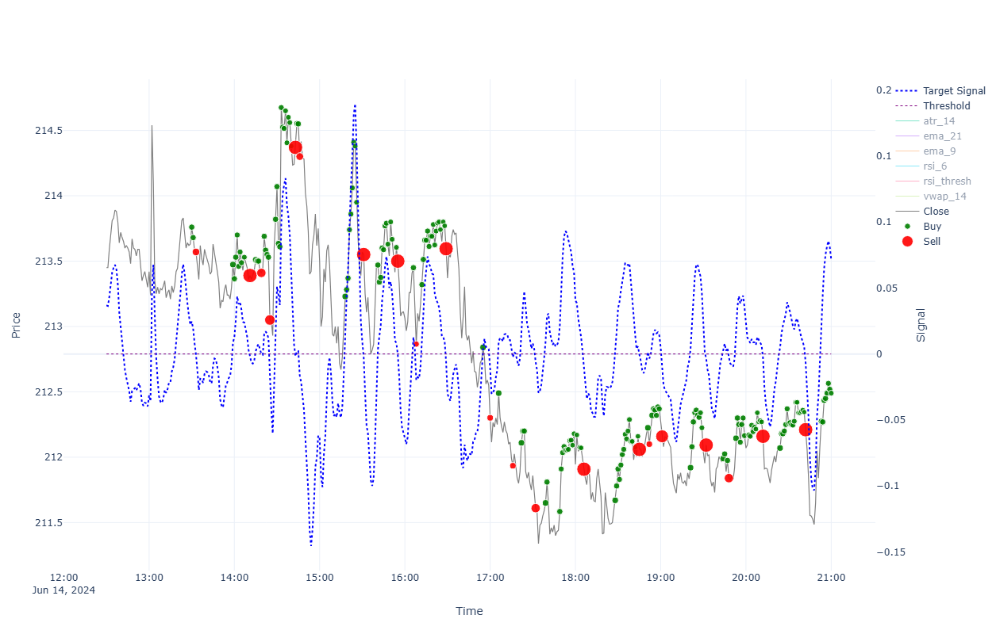


=== Performance for 2024-06-14 ===

INTRADAY:
  shares(521); [ask_buy=213.803, fee_buy=0.004, pos_amnt_buy=111393.318]; [bid_sell=212.448, fee_sell=0.019, pos_amnt_sell=110675.315]; PNL=-718.003
TRADES:
  Tr[1]: Time(13:30)Ask(213.803)Bid(213.717)Act(Buy)Shrs(6)Pos(6); CashTr(-1282.841)=Cost(-1282.817)-Fee(-0.024); P&L(23322.199)=CashTot(22039.896)+PosAmt(1282.303)
  Tr[2]: Time(13:31)Ask(213.723)Bid(213.637)Act(Buy)Shrs(6)Pos(12); CashTr(-1282.36)=Cost(-1282.336)-Fee(-0.024); P&L(23321.182)=CashTot(20757.535)+PosAmt(2563.647)
  Tr[3]: Time(13:33)Ask(213.613)Bid(213.527)Act(Sell)Shrs(12)Pos(0); CashTr(2562.101)=Cost(2562.327)-Fee(-0.227); P&L(23319.636)=CashTot(23319.636)+PosAmt(0.0)
  Tr[4]: Time(13:59)Ask(213.516)Bid(213.431)Act(Buy)Shrs(7)Pos(7); CashTr(-1494.642)=Cost(-1494.614)-Fee(-0.028); P&L(23319.01)=CashTot(21824.994)+PosAmt(1494.016)
  Tr[5]: Time(14:00)Ask(213.408)Bid(213.322)Act(Buy)Shrs(6)Pos(13); CashTr(-1280.47)=Cost(-1280.446)-Fee(-0.024); P&L(23317.714)=CashTot(20544

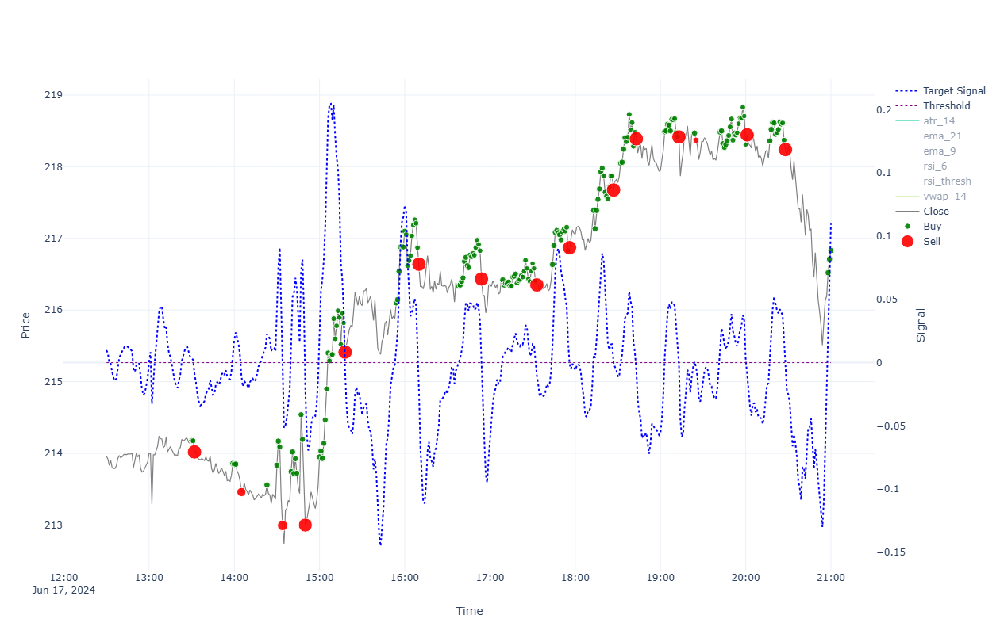


=== Performance for 2024-06-17 ===

INTRADAY:
  shares(516); [ask_buy=214.223, fee_buy=0.004, pos_amnt_buy=110541.047]; [bid_sell=216.787, fee_sell=0.019, pos_amnt_sell=111852.113]; PNL=1311.065
TRADES:
  Tr[1]: Time(13:30)Ask(214.223)Bid(214.137)Act(Buy)Shrs(4)Pos(47); CashTr(-856.907)=Cost(-856.891)-Fee(-0.016); P&L(23228.982)=CashTot(13164.535)+PosAmt(10064.447)
  Tr[2]: Time(13:31)Ask(214.218)Bid(214.132)Act(Buy)Shrs(4)Pos(51); CashTr(-856.887)=Cost(-856.871)-Fee(-0.016); P&L(23228.388)=CashTot(12307.648)+PosAmt(10920.74)
  Tr[3]: Time(13:32)Ask(214.063)Bid(213.977)Act(Sell)Shrs(51)Pos(0); CashTr(10911.873)=Cost(10912.837)-Fee(-0.964); P&L(23219.52)=CashTot(23219.52)+PosAmt(0.0)
  Tr[4]: Time(13:59)Ask(213.903)Bid(213.817)Act(Buy)Shrs(6)Pos(6); CashTr(-1283.441)=Cost(-1283.417)-Fee(-0.024); P&L(23218.983)=CashTot(21936.08)+PosAmt(1282.903)
  Tr[5]: Time(14:00)Ask(213.893)Bid(213.807)Act(Buy)Shrs(6)Pos(12); CashTr(-1283.381)=Cost(-1283.357)-Fee(-0.024); P&L(23218.386)=CashTot(20652

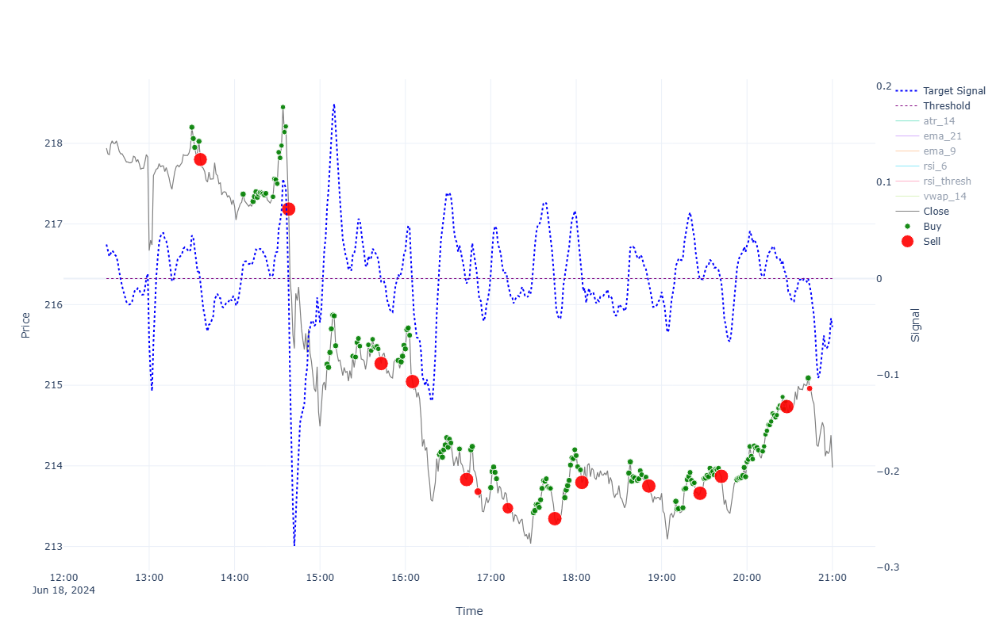


=== Performance for 2024-06-18 ===

INTRADAY:
  shares(512); [ask_buy=218.244, fee_buy=0.004, pos_amnt_buy=111742.792]; [bid_sell=213.937, fee_sell=0.019, pos_amnt_sell=109526.167]; PNL=-2216.624
TRADES:
  Tr[1]: Time(13:30)Ask(218.244)Bid(218.156)Act(Buy)Shrs(5)Pos(23); CashTr(-1091.238)=Cost(-1091.218)-Fee(-0.02); P&L(23074.275)=CashTot(18056.679)+PosAmt(5017.596)
  Tr[2]: Time(13:31)Ask(218.104)Bid(218.016)Act(Buy)Shrs(5)Pos(28); CashTr(-1090.538)=Cost(-1090.518)-Fee(-0.02); P&L(23070.6)=CashTot(16966.141)+PosAmt(6104.459)
  Tr[3]: Time(13:32)Ask(217.994)Bid(217.906)Act(Buy)Shrs(5)Pos(33); CashTr(-1089.988)=Cost(-1089.968)-Fee(-0.02); P&L(23067.065)=CashTot(15876.153)+PosAmt(7190.912)
  Tr[4]: Time(13:35)Ask(218.069)Bid(217.981)Act(Buy)Shrs(5)Pos(38); CashTr(-1090.363)=Cost(-1090.343)-Fee(-0.02); P&L(23069.083)=CashTot(14785.79)+PosAmt(8283.293)
  Tr[5]: Time(13:36)Ask(217.844)Bid(217.756)Act(Sell)Shrs(38)Pos(0); CashTr(8274.023)=Cost(8274.745)-Fee(-0.722); P&L(23059.813)=CashTot(2

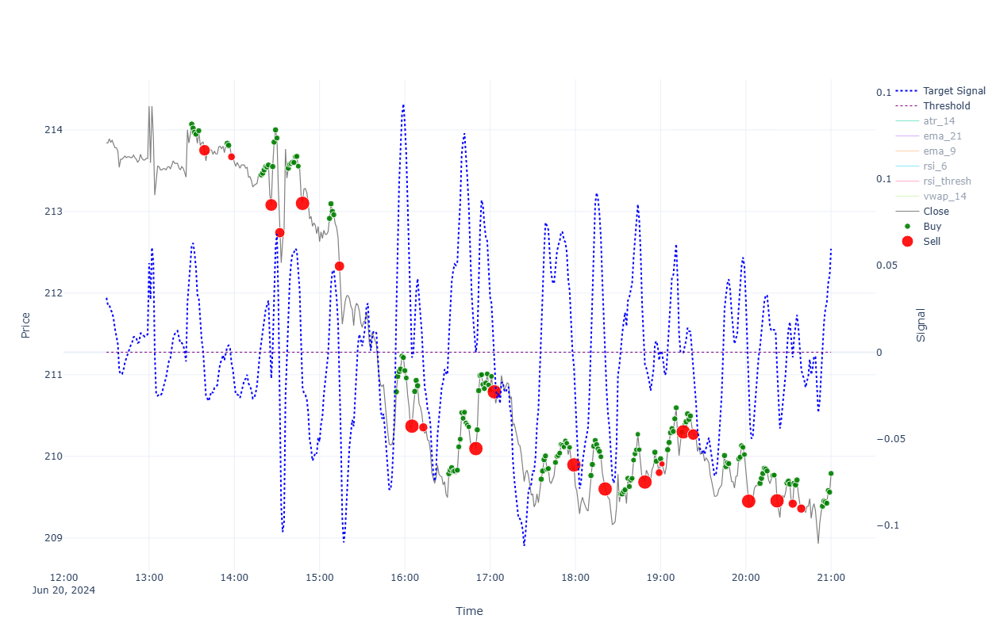


=== Performance for 2024-06-20 ===

INTRADAY:
  shares(511); [ask_buy=214.113, fee_buy=0.004, pos_amnt_buy=109413.692]; [bid_sell=209.748, fee_sell=0.019, pos_amnt_sell=107171.636]; PNL=-2242.056
TRADES:
  Tr[1]: Time(13:30)Ask(214.113)Bid(214.027)Act(Buy)Shrs(6)Pos(6); CashTr(-1284.701)=Cost(-1284.677)-Fee(-0.024); P&L(22912.282)=CashTot(21628.119)+PosAmt(1284.163)
  Tr[2]: Time(13:31)Ask(214.063)Bid(213.977)Act(Buy)Shrs(6)Pos(12); CashTr(-1284.401)=Cost(-1284.377)-Fee(-0.024); P&L(22911.444)=CashTot(20343.718)+PosAmt(2567.726)
  Tr[3]: Time(13:32)Ask(214.013)Bid(213.927)Act(Buy)Shrs(6)Pos(18); CashTr(-1284.101)=Cost(-1284.077)-Fee(-0.024); P&L(22910.307)=CashTot(19059.617)+PosAmt(3850.69)
  Tr[4]: Time(13:33)Ask(213.989)Bid(213.903)Act(Buy)Shrs(5)Pos(23); CashTr(-1069.963)=Cost(-1069.943)-Fee(-0.02); P&L(22909.424)=CashTot(17989.654)+PosAmt(4919.769)
  Tr[5]: Time(13:35)Ask(214.033)Bid(213.947)Act(Buy)Shrs(5)Pos(28); CashTr(-1070.184)=Cost(-1070.164)-Fee(-0.02); P&L(22909.992)=CashT

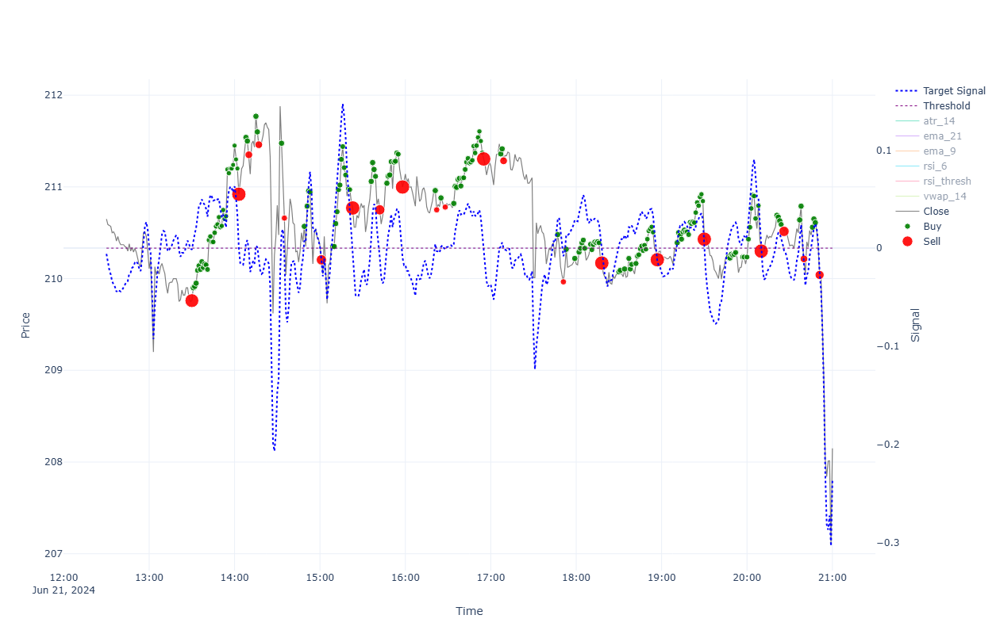


=== Performance for 2024-06-21 ===

INTRADAY:
  shares(510); [ask_buy=209.802, fee_buy=0.004, pos_amnt_buy=107001.036]; [bid_sell=208.108, fee_sell=0.019, pos_amnt_sell=106125.694]; PNL=-875.342
TRADES:
  Tr[1]: Time(13:30)Ask(209.802)Bid(209.718)Act(Sell)Shrs(38)Pos(0); CashTr(7968.571)=Cost(7969.286)-Fee(-0.715); P&L(22633.214)=CashTot(22633.214)+PosAmt(0.0)
  Tr[2]: Time(13:31)Ask(209.942)Bid(209.858)Act(Buy)Shrs(6)Pos(6); CashTr(-1259.676)=Cost(-1259.652)-Fee(-0.024); P&L(22632.687)=CashTot(21373.539)+PosAmt(1259.148)
  Tr[3]: Time(13:32)Ask(209.957)Bid(209.873)Act(Buy)Shrs(6)Pos(12); CashTr(-1259.766)=Cost(-1259.742)-Fee(-0.024); P&L(22632.249)=CashTot(20113.773)+PosAmt(2518.476)
  Tr[4]: Time(13:33)Ask(209.992)Bid(209.908)Act(Buy)Shrs(6)Pos(18); CashTr(-1259.976)=Cost(-1259.952)-Fee(-0.024); P&L(22632.141)=CashTot(18853.797)+PosAmt(3778.344)
  Tr[5]: Time(13:34)Ask(210.132)Bid(210.048)Act(Buy)Shrs(5)Pos(23); CashTr(-1050.68)=Cost(-1050.66)-Fee(-0.02); P&L(22634.22)=CashTot(17803


=== Performance for 2024-06-24 ===

INTRADAY:
  shares(510); [ask_buy=207.822, fee_buy=0.004, pos_amnt_buy=105991.034]; [bid_sell=208.568, fee_sell=0.019, pos_amnt_sell=106360.241]; PNL=369.208
TRADES:
  Tr[1]: Time(13:32)Ask(207.827)Bid(207.743)Act(Buy)Shrs(6)Pos(6); CashTr(-1246.983)=Cost(-1246.959)-Fee(-0.024); P&L(22515.756)=CashTot(21269.296)+PosAmt(1246.461)
  Tr[2]: Time(13:33)Ask(207.872)Bid(207.788)Act(Buy)Shrs(6)Pos(12); CashTr(-1247.253)=Cost(-1247.229)-Fee(-0.024); P&L(22515.504)=CashTot(20022.042)+PosAmt(2493.461)
  Tr[3]: Time(13:34)Ask(207.702)Bid(207.618)Act(Sell)Shrs(12)Pos(0); CashTr(2491.196)=Cost(2491.422)-Fee(-0.225); P&L(22513.239)=CashTot(22513.239)+PosAmt(0.0)
  Tr[4]: Time(13:44)Ask(207.842)Bid(207.758)Act(Buy)Shrs(6)Pos(6); CashTr(-1247.073)=Cost(-1247.049)-Fee(-0.024); P&L(22512.716)=CashTot(21266.166)+PosAmt(1246.551)
  Tr[5]: Time(13:45)Ask(207.842)Bid(207.758)Act(Buy)Shrs(6)Pos(12); CashTr(-1247.073)=Cost(-1247.049)-Fee(-0.024); P&L(22512.193)=CashTot(200

In [ ]:
importlib.reload(params) ######
importlib.reload(plots) ######

df_month = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check]
year, month = map(int, params.month_to_check.split("-"))
days_in_month = [d for d in sim_results if d.year == year and d.month == month]
days_all = [d for d in sim_results]

if not days_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for day in sorted(days_in_month):
        df_day_plot, trades_day, stats_day = sim_results[day]
        plots.plot_trades(
            df                 = df_day_plot,
            col_signal1        = col_signal,
            sign_thresh        = sign_thresh, 
            axis_sig_thresh    = 'second',
            trades             = trades_day,
            performance_stats  = stats_day,
            features           = ['ema_9','ema_21','rsi_6', 'atr_14', 'vwap_14', 'rsi_thresh'],
            start_plot         = params.sess_start_shift,
            autoscale          = False
        )
        
        print(f"\n=== Performance for {day.strftime('%Y-%m-%d')} ===\n")
        
        for k, v in stats_day.items():
            lines = v if isinstance(v, list) else str(v).splitlines()
            print(f"{k}:")
            for L in lines:
                print("  " + L)
        print("\n" + "-" * 120 + "\n")

# monthly / overall aggregates
plots.aggregate_performance(df = df_month, 
                            perf_list = [sim_results[d][2] for d in sorted(days_in_month)])
plots.aggregate_performance(df = df_inds_test,
                            perf_list = [sim_results[d][2] for d in sorted(days_all)])
